# Solar Radiation Data Analysis

## Exploratory Data Analysis for Strategic Solar Investment Recommendations

**Author:** Sosina Sisay  
**Date:** September 26, 2025  
**Objective:** Analyze solar radiation measurement data from Benin, Sierra Leone, and Togo to identify high-potential regions for solar installations, supporting MoonLight Energy Solutions' sustainability goals.

This notebook utilizes utility scripts from the `scripts/` folder to perform comprehensive EDA and provide data-driven strategic recommendations.

## 1. Import Libraries and Load Data

Import necessary libraries and load the solar radiation datasets using utility functions from the scripts folder.

In [1]:
# Import required libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import warnings
warnings.filterwarnings('ignore')

# Set plotting style
plt.style.use('seaborn-v0_8')
sns.set_palette("husl")

# Import utility functions from scripts
import sys
sys.path.append('../scripts')

from data_load import load_csv, load_country_files
from qa import basic_quality_report, drop_bad_timestamps
from eda import plot_time_series, correlation_matrix, wind_rose
from stats import compute_zscore, flag_outliers_z, cleaning_impact_test
from transform import fill_interpolate, add_daily_aggregates, add_post_clean_flag
from scoring import country_score

# Load datasets
file_map = {
    "Benin": "../data/raw/benin-malanville.csv",
    "Sierra Leone": "../data/raw/sierraleone-bumbuna.csv", 
    "Togo": "../data/raw/togo-dapaong_qc.csv"
}

dfs = load_country_files(file_map)
print("Loaded datasets for countries:", list(dfs.keys()))
print("\nDataset shapes:")
for country, df in dfs.items():
    print(f"{country}: {df.shape}")

Loaded datasets for countries: ['Benin', 'Sierra Leone', 'Togo']

Dataset shapes:
Benin: (525600, 19)
Sierra Leone: (525600, 19)
Togo: (525600, 19)


In [2]:
# Preview data structure
print("Sample data from Benin:")
dfs['Benin'].head()

Sample data from Benin:


,Timestamp,GHI,DNI,DHI,ModA,ModB,Tamb,RH,WS,WSgust,WSstdev,WD,WDstdev,BP,Cleaning,Precipitation,TModA,TModB,Comments
0,2021-08-09 00:01:00,-1.2,-0.2,-1.1,0.0,0.0,26.2,93.4,0.0,0.4,0.1,122.1,0.0,998,0,0.0,26.3,26.2,NaN
1,2021-08-09 00:02:00,-1.1,-0.2,-1.1,0.0,0.0,26.2,93.6,0.0,0.0,0.0,0.0,0.0,998,0,0.0,26.3,26.2,NaN
2,2021-08-09 00:03:00,-1.1,-0.2,-1.1,0.0,0.0,26.2,93.7,0.3,1.1,0.5,124.6,1.5,997,0,0.0,26.4,26.2,NaN
3,2021-08-09 00:04:00,-1.1,-0.1,-1.0,0.0,0.0,26.2,93.3,0.2,0.7,0.4,120.3,1.3,997,0,0.0,26.4,26.3,NaN
4,2021-08-09 00:05:00,-1.0,-0.1,-1.0,0.0,0.0,26.2,93.3,0.1,0.7,0.3,113.2,1.0,997,0,0.0,26.4,26.3,NaN


## 2. Summary Statistics

Calculate mean, median, standard deviation, and other statistical measures for each numeric column to understand data distribution.

In [3]:
# Summary statistics for each country
summary_stats = {}

for country, df in dfs.items():
    numeric_cols = df.select_dtypes(include=[np.number]).columns
    stats = df[numeric_cols].describe().T
    stats['skewness'] = df[numeric_cols].skew()
    stats['kurtosis'] = df[numeric_cols].kurtosis()
    summary_stats[country] = stats

print("Summary Statistics for Benin:")
summary_stats['Benin']

Summary Statistics for Benin:


,count,mean,std,min,25%,50%,75%,max,skewness,kurtosis
GHI,525600.0,240.559452,331.131327,-12.9,-2.0,1.8,483.4,1413.0,1.028446,-0.460184
DNI,525600.0,167.187516,261.710501,-7.8,-0.5,-0.1,314.2,952.3,1.290260,0.172956
DHI,525600.0,115.358961,158.691074,-12.6,-2.1,1.6,216.3,759.2,1.210406,0.498993
ModA,525600.0,236.589496,326.894859,0.0,0.0,4.5,463.7,1342.3,1.067416,-0.387674
ModB,525600.0,228.883576,316.536515,0.0,0.0,4.3,447.9,1342.3,1.076031,-0.351332
Tamb,525600.0,28.179683,5.924297,11.0,24.2,28.0,32.3,43.8,0.000512,-0.444624
RH,525600.0,54.487969,28.073069,2.1,28.8,55.1,80.1,100.0,-0.026653,-1.298555
WS,525600.0,2.121113,1.603466,0.0,1.0,1.9,3.1,19.5,0.868406,1.579008
WSgust,525600.0,2.809195,2.029120,0.0,1.3,2.6,4.1,26.6,0.928908,1.942468
WSstdev,525600.0,0.473390,0.273395,0.0,0.4,0.5,0.6,4.2,0.695449,3.348514


## 3. Data Quality Check

Check for missing values, outliers, and incorrect entries in key columns like GHI, DNI, DHI, ModA, ModB, WS, and WSgust.

In [4]:
# Data quality reports using qa.py
qa_reports = {}

for country, df in dfs.items():
    qa_reports[country] = basic_quality_report(df)

print("Data Quality Report for Benin:")
for key, value in qa_reports['Benin'].items():
    print(f"{key}: {value}")

# Check for negative values in columns that should be non-negative
print("\nNegative value counts:")
for country, report in qa_reports.items():
    print(f"\n{country}:")
    for col, count in report['negative_counts'].items():
        if count > 0:
            print(f"  {col}: {count} negative values")

# Check Comments column (should be mostly null)
print("\nComments column analysis:")
for country, df in dfs.items():
    if 'Comments' in df.columns:
        null_count = df['Comments'].isnull().sum()
        total_count = len(df)
        print(f"{country}: {null_count}/{total_count} null values ({100*null_count/total_count:.1f}%)")

Data Quality Report for Benin:
n_rows: 525600
n_cols: 19
missing_per_col: {'Timestamp': 0, 'GHI': 0, 'DNI': 0, 'DHI': 0, 'ModA': 0, 'ModB': 0, 'Tamb': 0, 'RH': 0, 'WS': 0, 'WSgust': 0, 'WSstdev': 0, 'WD': 0, 'WDstdev': 0, 'BP': 0, 'Cleaning': 0, 'Precipitation': 0, 'TModA': 0, 'TModB': 0, 'Comments': 525600}
dtypes: {'Timestamp': 'datetime64[ns]', 'GHI': 'float64', 'DNI': 'float64', 'DHI': 'float64', 'ModA': 'float64', 'ModB': 'float64', 'Tamb': 'float64', 'RH': 'float64', 'WS': 'float64', 'WSgust': 'float64', 'WSstdev': 'float64', 'WD': 'float64', 'WDstdev': 'float64', 'BP': 'int64', 'Cleaning': 'int64', 'Precipitation': 'float64', 'TModA': 'float64', 'TModB': 'float64', 'Comments': 'float64'}
negative_counts: {'GHI': 258847, 'DNI': 275987, 'DHI': 259182, 'ModA': 0, 'ModB': 0, 'Precipitation': 0, 'WS': 0, 'WSgust': 0}
duplicate_rows: 0

Negative value counts:

Benin:
  GHI: 258847 negative values
  DNI: 275987 negative values
  DHI: 259182 negative values

Sierra Leone:
  GHI: 261135 

## 4. Time Series Analysis

Plot time series of GHI, DNI, DHI, and Tamb over time to observe patterns, trends, and anomalies. Also evaluate the impact of cleaning on sensor readings.

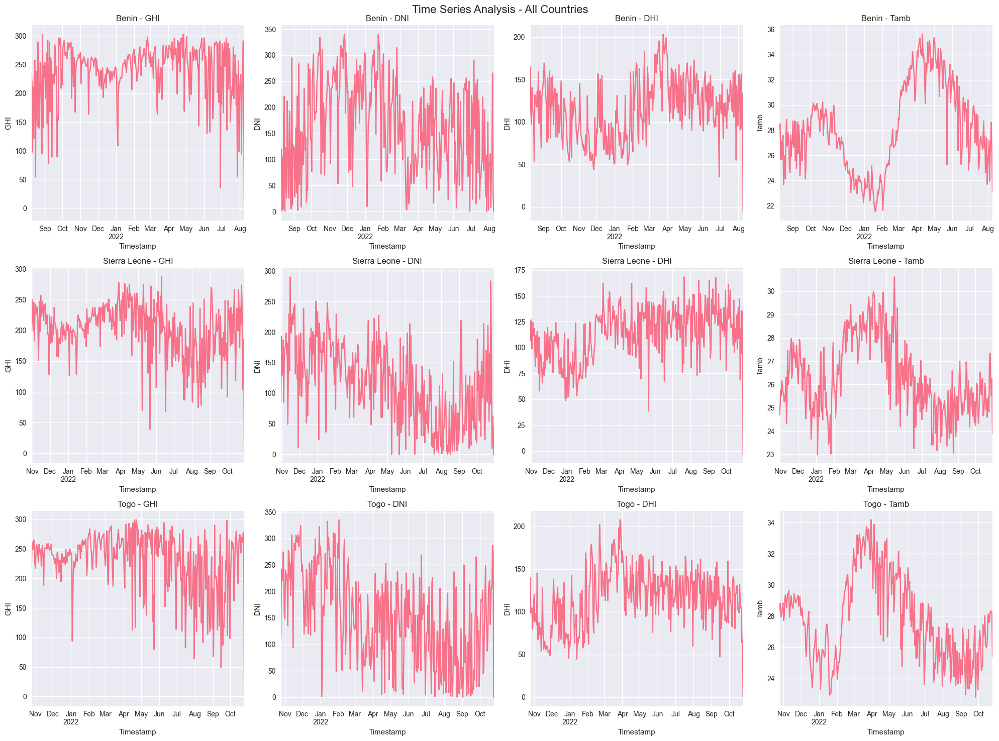

Cleaning Impact Analysis:

Benin - ModA cleaning impact:
  Events analyzed: 485
  Mean before cleaning: 230.95
  Mean after cleaning: 235.84
  Difference: 4.89
  P-value: 0.0323

Sierra Leone - ModA cleaning impact:
  Events analyzed: 508
  Mean before cleaning: 204.23
  Mean after cleaning: 204.94
  Difference: 0.71
  P-value: 0.7397

Togo - ModA cleaning impact:
  Events analyzed: 281
  Mean before cleaning: 233.38
  Mean after cleaning: 230.71
  Difference: -2.67
  P-value: 0.3392


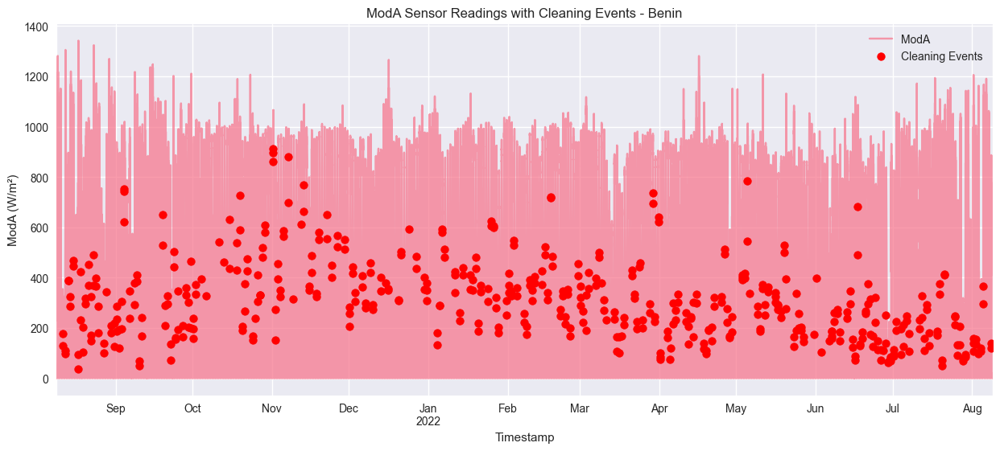

In [5]:
# Time series plots for key metrics - All Countries
fig, axes = plt.subplots(3, 4, figsize=(20, 15))
fig.suptitle('Time Series Analysis - All Countries', fontsize=16)

metrics = ['GHI', 'DNI', 'DHI', 'Tamb']
countries = list(dfs.keys())

for i, country in enumerate(countries):
    for j, metric in enumerate(metrics):
        ax = axes[i, j]
        if metric in dfs[country].columns:
            plot_time_series(dfs[country], metric=metric, freq='D', ax=ax)
            ax.set_title(f'{country} - {metric}')

plt.tight_layout()
plt.show()

# Analyze cleaning impact on sensor readings
print("Cleaning Impact Analysis:")
for country, df in dfs.items():
    if 'Cleaning' in df.columns and 'ModA' in df.columns:
        impact = cleaning_impact_test(df, metric='ModA')
        print(f"\n{country} - ModA cleaning impact:")
        print(f"  Events analyzed: {impact['n_events']}")
        if impact['n_events'] > 0:
            print(f"  Mean before cleaning: {impact['mean_pre']:.2f}")
            print(f"  Mean after cleaning: {impact['mean_post']:.2f}")
            print(f"  Difference: {impact['mean_diff']:.2f}")
            print(f"  P-value: {impact['p_value']:.4f}")

# Plot cleaning events and sensor readings
fig, ax = plt.subplots(figsize=(15, 6))
benin_df = dfs['Benin'].copy()
benin_df = benin_df.set_index('Timestamp')
benin_df['ModA'].plot(ax=ax, alpha=0.7, label='ModA')
cleaning_events = benin_df[benin_df['Cleaning'] == 1]
ax.scatter(cleaning_events.index, cleaning_events['ModA'], color='red', s=50, label='Cleaning Events', zorder=5)
ax.set_title('ModA Sensor Readings with Cleaning Events - Benin')
ax.set_ylabel('ModA (W/m²)')
ax.legend()
plt.show()

## 5. Correlation Analysis

Create correlation matrices and pair plots for solar radiation components and environmental factors.


=== Correlation Analysis for Benin ===


<Figure size 1000x800 with 0 Axes>

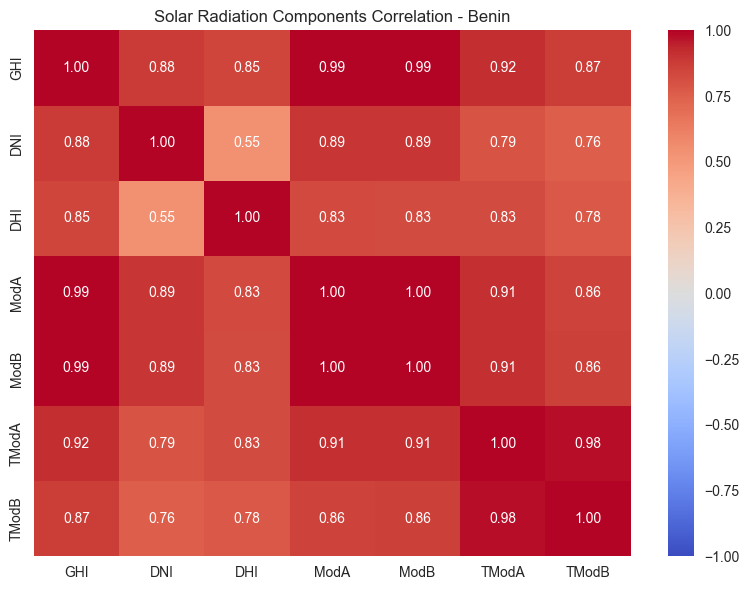

<Figure size 1000x800 with 0 Axes>

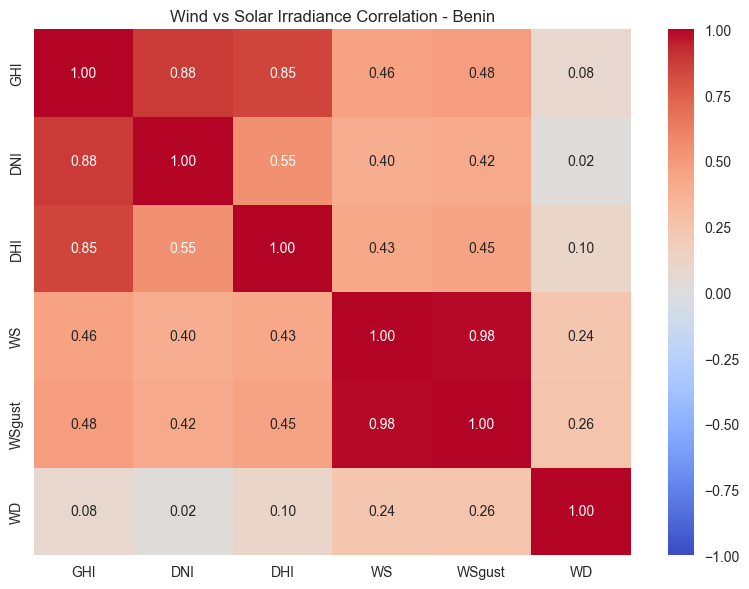

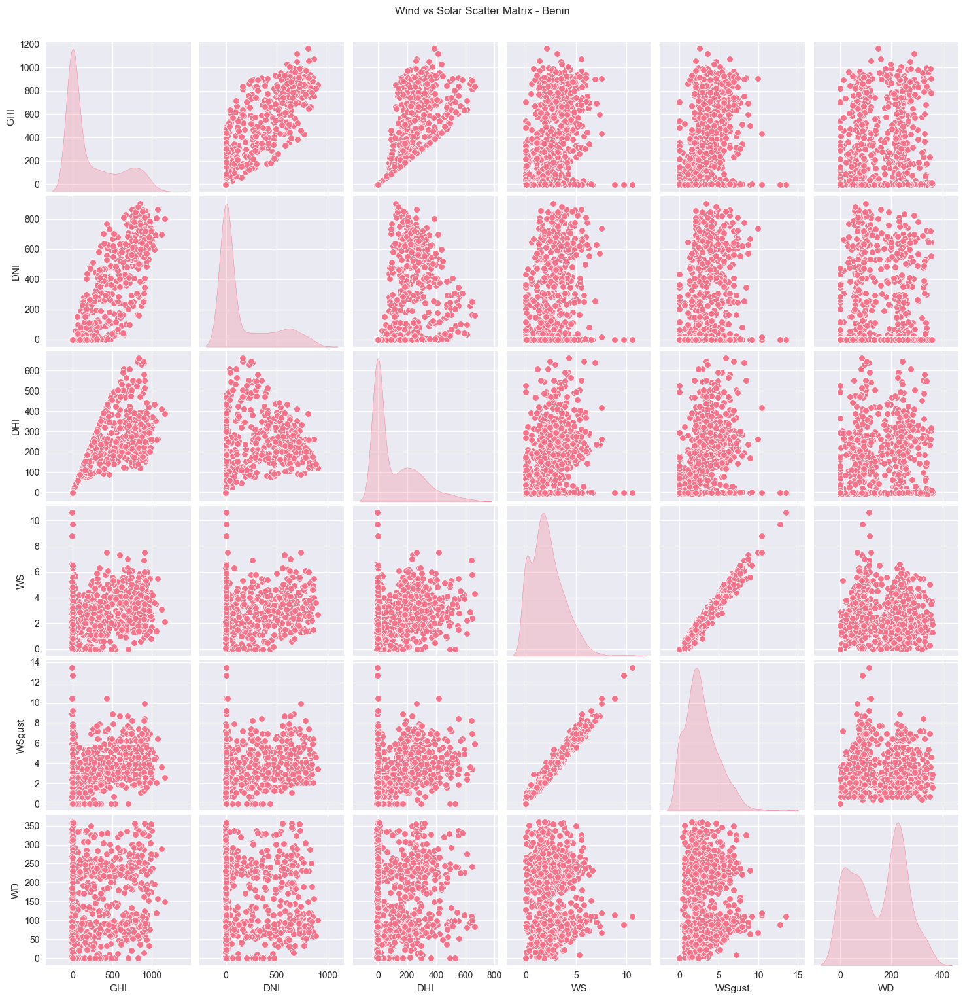

<Figure size 1000x800 with 0 Axes>

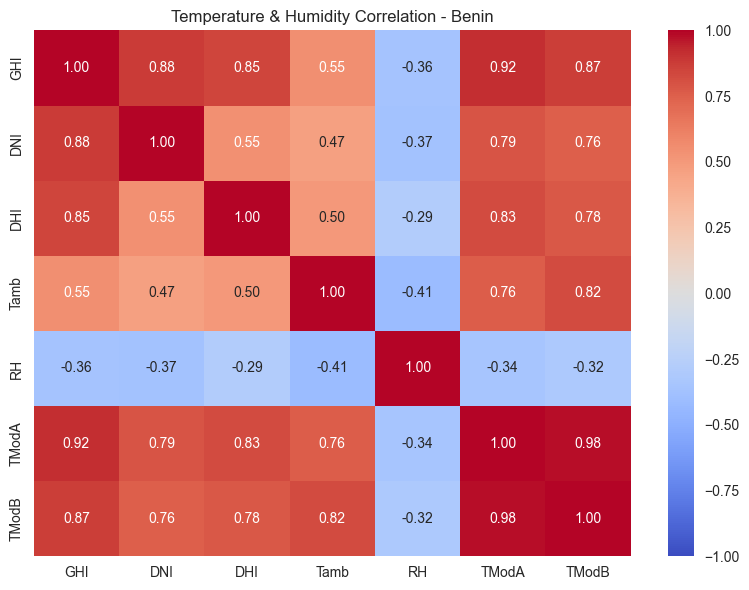


=== Correlation Analysis for Sierra Leone ===


<Figure size 1000x800 with 0 Axes>

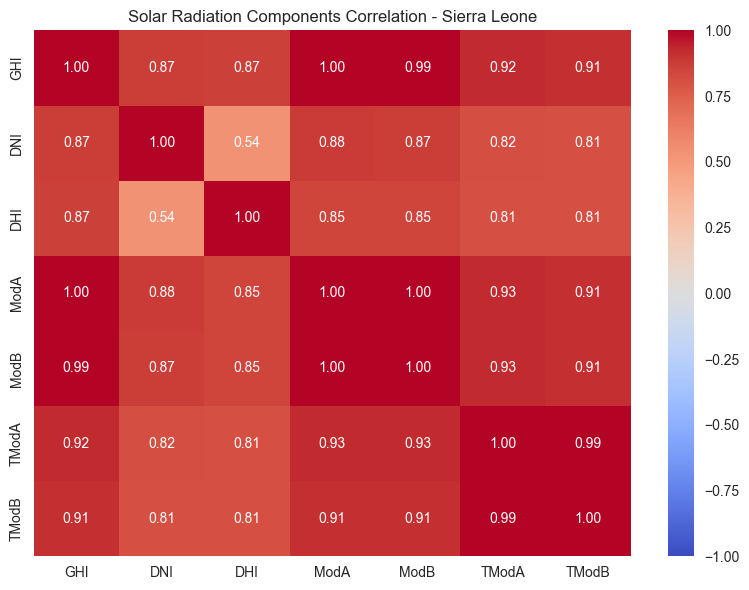

<Figure size 1000x800 with 0 Axes>

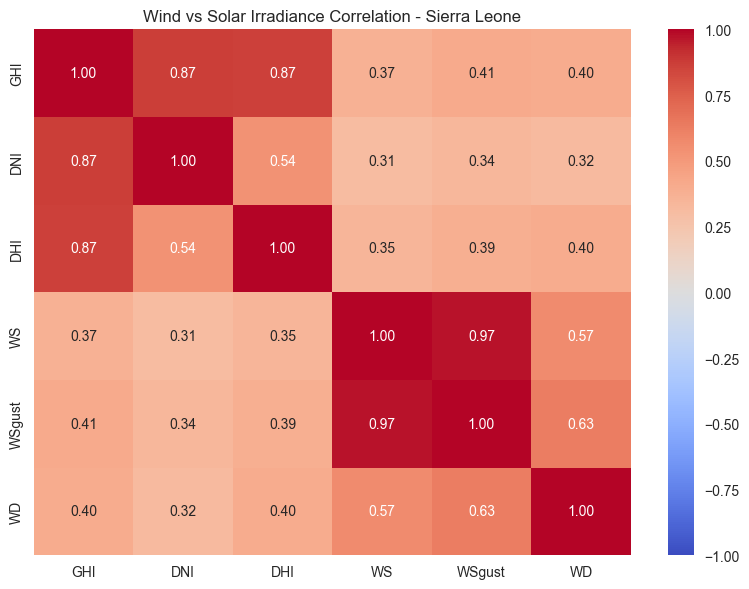

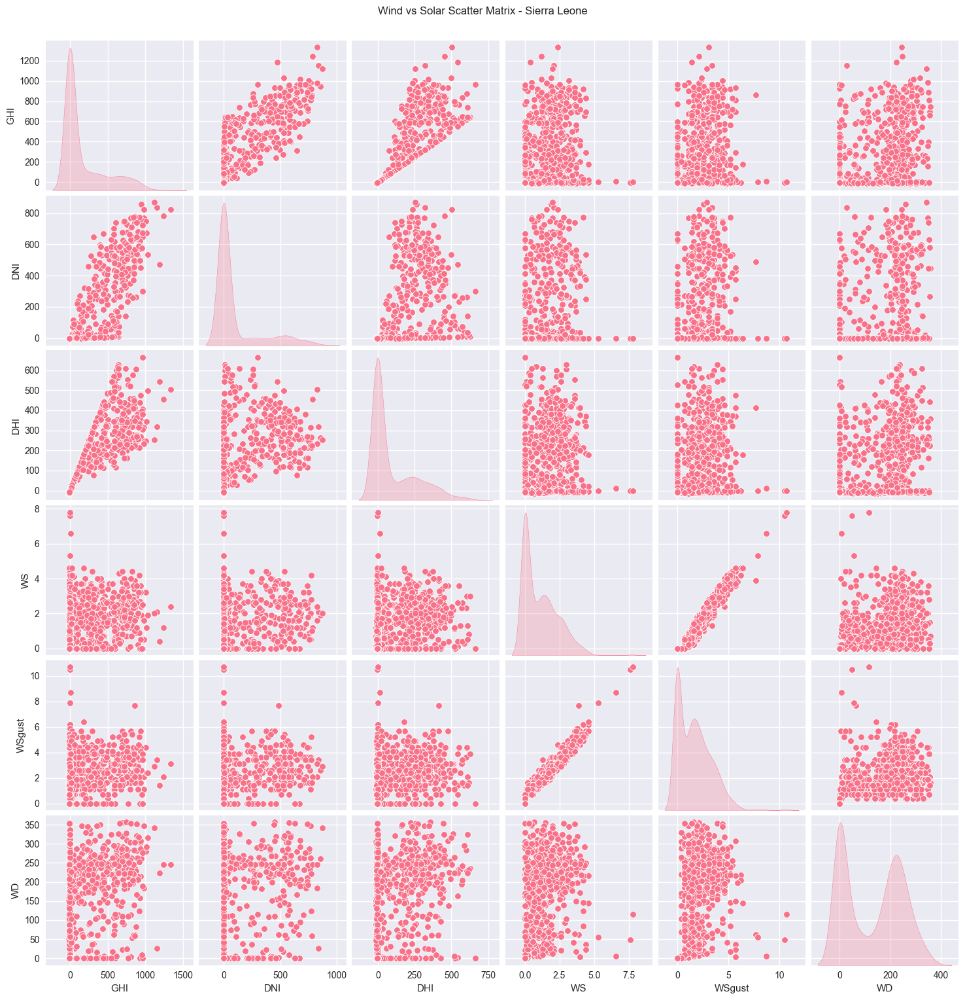

<Figure size 1000x800 with 0 Axes>

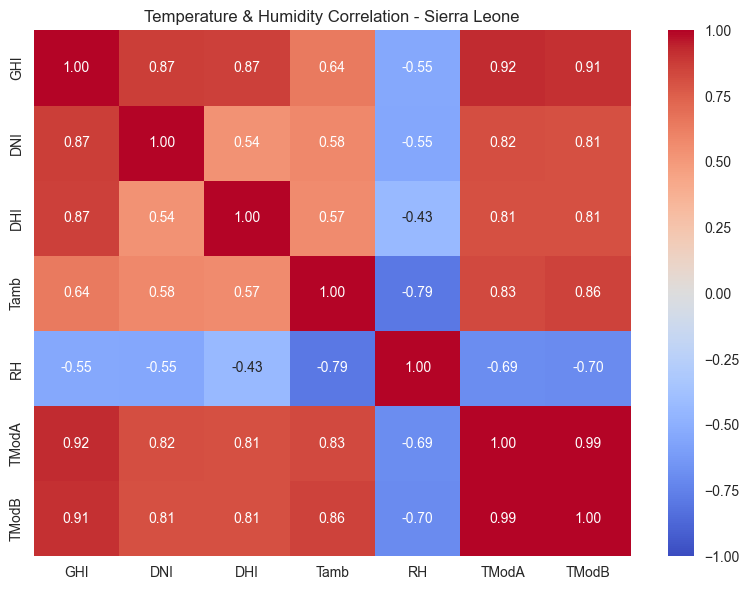


=== Correlation Analysis for Togo ===


<Figure size 1000x800 with 0 Axes>

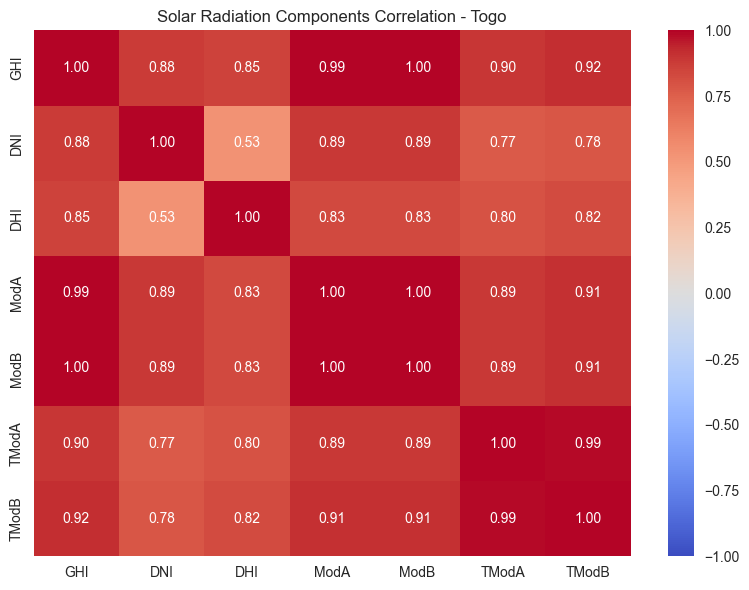

<Figure size 1000x800 with 0 Axes>

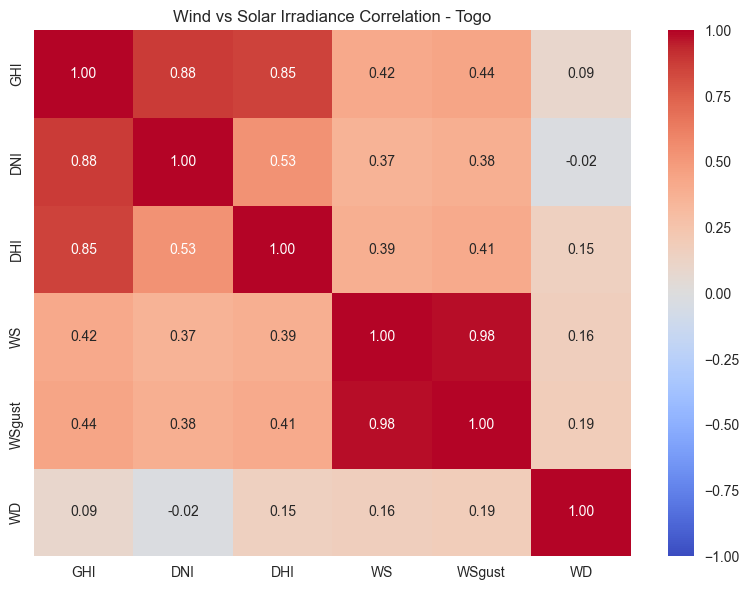

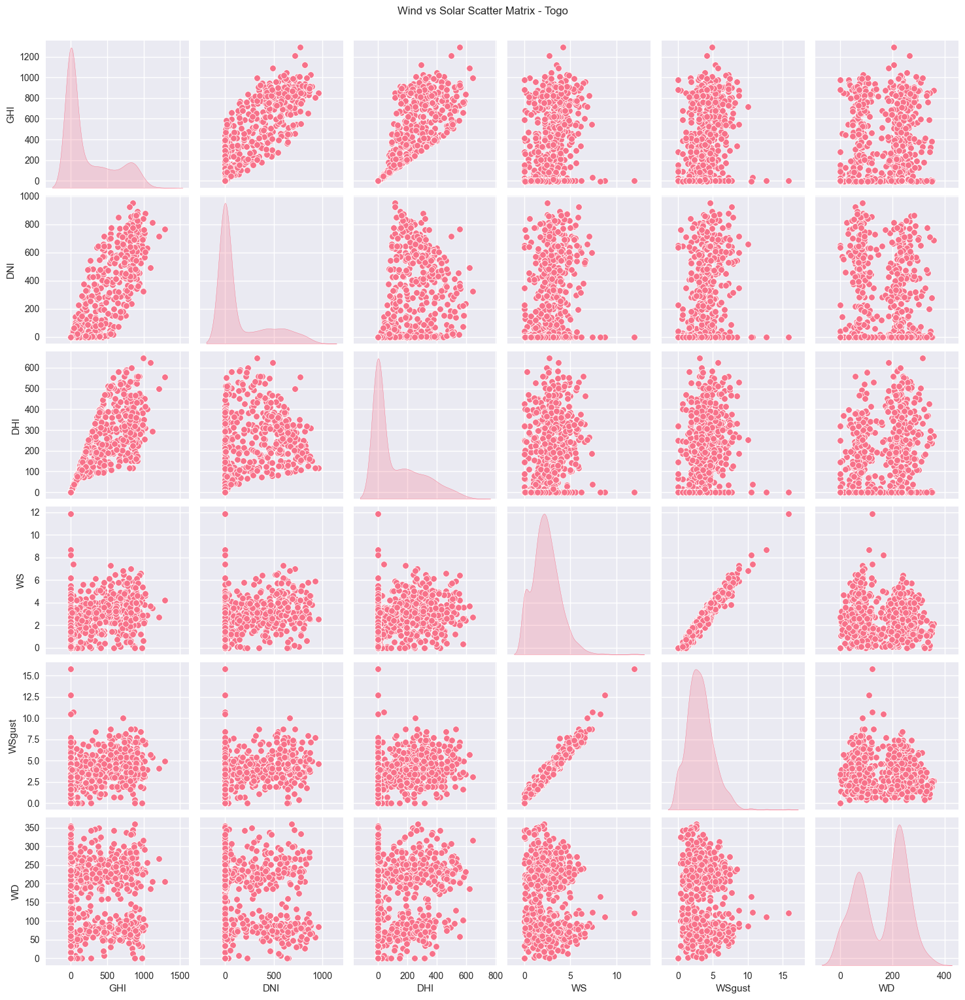

<Figure size 1000x800 with 0 Axes>

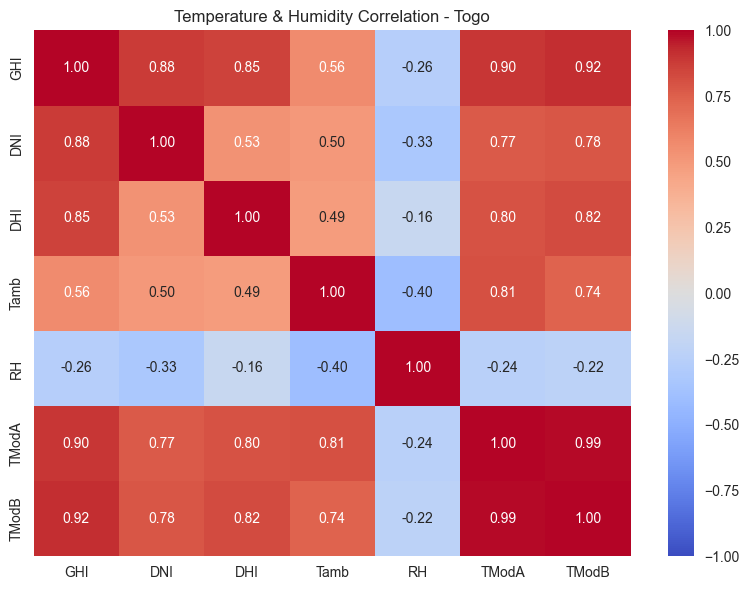

In [6]:
# Correlation analysis for all countries
for country, df in dfs.items():
    print(f"\n=== Correlation Analysis for {country} ===")
    
    # Solar radiation components
    solar_cols = ['GHI', 'DNI', 'DHI', 'ModA', 'ModB', 'TModA', 'TModB']
    available_solar_cols = [col for col in solar_cols if col in df.columns]
    
    if len(available_solar_cols) > 1:
        plt.figure(figsize=(10, 8))
        corr_solar = correlation_matrix(df, cols=available_solar_cols)
        plt.title(f'Solar Radiation Components Correlation - {country}')
        plt.tight_layout()
        plt.show()
    
    # Wind conditions and solar irradiance
    wind_solar_cols = ['GHI', 'DNI', 'DHI', 'WS', 'WSgust', 'WD']
    available_wind_cols = [col for col in wind_solar_cols if col in df.columns]
    
    if len(available_wind_cols) > 1:
        plt.figure(figsize=(10, 8))
        corr_wind_solar = correlation_matrix(df, cols=available_wind_cols)
        plt.title(f'Wind vs Solar Irradiance Correlation - {country}')
        plt.tight_layout()
        plt.show()
        
        # Scatter plot matrix for wind vs solar (sample for performance)
        sns.pairplot(df[available_wind_cols].sample(min(1000, len(df))), diag_kind='kde')
        plt.suptitle(f'Wind vs Solar Scatter Matrix - {country}', y=1.02)
        plt.show()
    
    # Temperature and humidity correlations
    temp_humidity_cols = ['GHI', 'DNI', 'DHI', 'Tamb', 'RH', 'TModA', 'TModB']
    available_temp_cols = [col for col in temp_humidity_cols if col in df.columns]
    
    if len(available_temp_cols) > 1:
        plt.figure(figsize=(10, 8))
        corr_temp = correlation_matrix(df, cols=available_temp_cols)
        plt.title(f'Temperature & Humidity Correlation - {country}')
        plt.tight_layout()
        plt.show()

In [7]:
# Extended Correlation Analysis for All Countries
print("=== Correlation Analysis for All Countries ===")

correlation_summary = {}

for country, df in dfs.items():
    print(f"\n--- {country} Correlation Summary ---")
    
    corr_data = {}
    
    # Solar radiation components correlation
    solar_cols = ['GHI', 'DNI', 'DHI', 'ModA', 'ModB']
    available_solar = [col for col in solar_cols if col in df.columns]
    if len(available_solar) > 1:
        solar_corr = df[available_solar].corr()
        corr_data['GHI_DNI'] = solar_corr.loc['GHI', 'DNI'] if 'GHI' in solar_corr.index and 'DNI' in solar_corr.columns else None
        corr_data['GHI_DHI'] = solar_corr.loc['GHI', 'DHI'] if 'GHI' in solar_corr.index and 'DHI' in solar_corr.columns else None
        print(f"GHI-DNI Correlation: {corr_data['GHI_DNI']:.3f}" if corr_data['GHI_DNI'] else "GHI-DNI: N/A")
        print(f"GHI-DHI Correlation: {corr_data['GHI_DHI']:.3f}" if corr_data['GHI_DHI'] else "GHI-DHI: N/A")
    
    # Wind and solar correlation
    wind_solar_cols = ['GHI', 'WS', 'WD']
    available_wind_solar = [col for col in wind_solar_cols if col in df.columns]
    if len(available_wind_solar) > 1:
        wind_corr = df[available_wind_solar].corr()
        corr_data['GHI_WS'] = wind_corr.loc['GHI', 'WS'] if 'GHI' in wind_corr.index and 'WS' in wind_corr.columns else None
        print(f"GHI-Wind Speed Correlation: {corr_data['GHI_WS']:.3f}" if corr_data['GHI_WS'] else "GHI-WS: N/A")
    
    # Temperature correlations
    temp_cols = ['GHI', 'Tamb', 'RH']
    available_temp = [col for col in temp_cols if col in df.columns]
    if len(available_temp) > 1:
        temp_corr = df[available_temp].corr()
        corr_data['GHI_Tamb'] = temp_corr.loc['GHI', 'Tamb'] if 'GHI' in temp_corr.index and 'Tamb' in temp_corr.columns else None
        corr_data['Tamb_RH'] = temp_corr.loc['Tamb', 'RH'] if 'Tamb' in temp_corr.index and 'RH' in temp_corr.columns else None
        print(f"GHI-Temperature Correlation: {corr_data['GHI_Tamb']:.3f}" if corr_data['GHI_Tamb'] else "GHI-Tamb: N/A")
        print(f"Temperature-RH Correlation: {corr_data['Tamb_RH']:.3f}" if corr_data['Tamb_RH'] else "Tamb-RH: N/A")
    
    correlation_summary[country] = corr_data

print("\n=== Correlation Comparison Across Countries ===")
corr_comparison = {}
for country, corrs in correlation_summary.items():
    corr_comparison[country] = corrs

corr_comp_df = pd.DataFrame(corr_comparison).T
print(corr_comp_df.round(3))

=== Correlation Analysis for All Countries ===

--- Benin Correlation Summary ---
GHI-DNI Correlation: 0.882
GHI-DHI Correlation: 0.850
GHI-Wind Speed Correlation: 0.457
GHI-Temperature Correlation: 0.548
Temperature-RH Correlation: -0.415

--- Sierra Leone Correlation Summary ---
GHI-DNI Correlation: 0.869
GHI-DHI Correlation: 0.866
GHI-Wind Speed Correlation: 0.371
GHI-Temperature Correlation: 0.641
Temperature-RH Correlation: -0.792

--- Togo Correlation Summary ---
GHI-DNI Correlation: 0.877
GHI-DHI Correlation: 0.852
GHI-Wind Speed Correlation: 0.422
GHI-Temperature Correlation: 0.563
Temperature-RH Correlation: -0.400

=== Correlation Comparison Across Countries ===
              GHI_DNI  GHI_DHI  GHI_WS  GHI_Tamb  Tamb_RH
Benin           0.882    0.850   0.457     0.548   -0.415
Sierra Leone    0.869    0.866   0.371     0.641   -0.792
Togo            0.877    0.852   0.422     0.563   -0.400


## 6. Wind Analysis

Use wind roses to show distribution of wind speed and direction, highlighting trends and variability.

Wind Analysis for Benin:
  Mean wind speed: 2.12 m/s
  Max wind speed: 19.50 m/s
  Wind speed std: 1.60 m/s
  Wind direction std: 102.33°


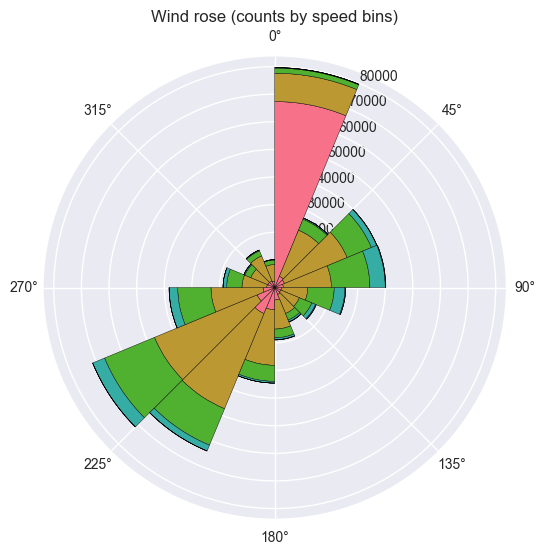

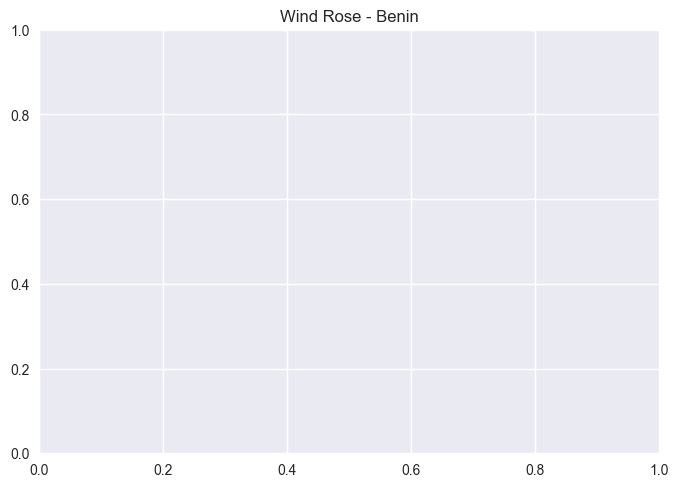

Wind Analysis for Sierra Leone:
  Mean wind speed: 1.15 m/s
  Max wind speed: 19.20 m/s
  Wind speed std: 1.24 m/s
  Wind direction std: 114.28°


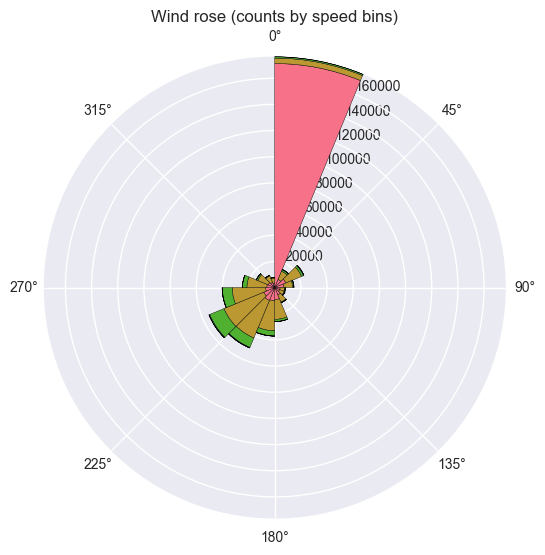

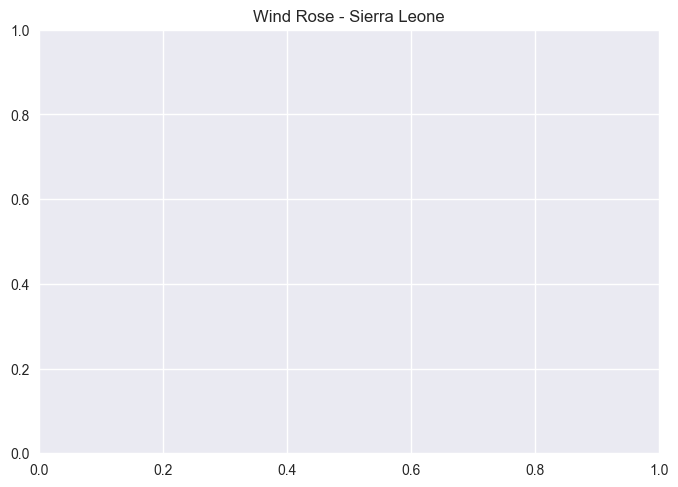

Wind Analysis for Togo:
  Mean wind speed: 2.37 m/s
  Max wind speed: 16.10 m/s
  Wind speed std: 1.46 m/s
  Wind direction std: 91.88°


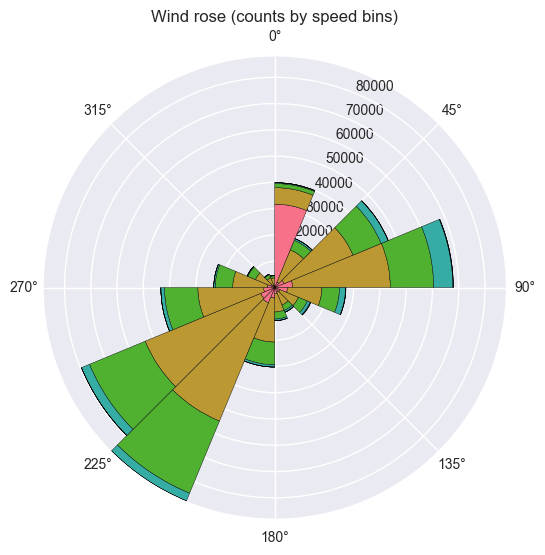

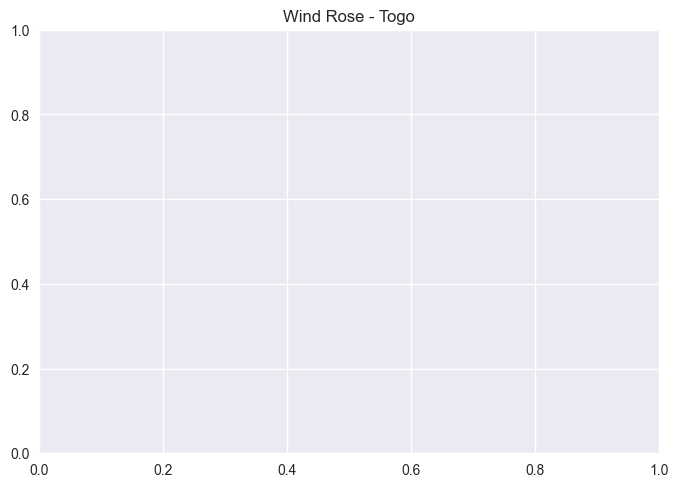

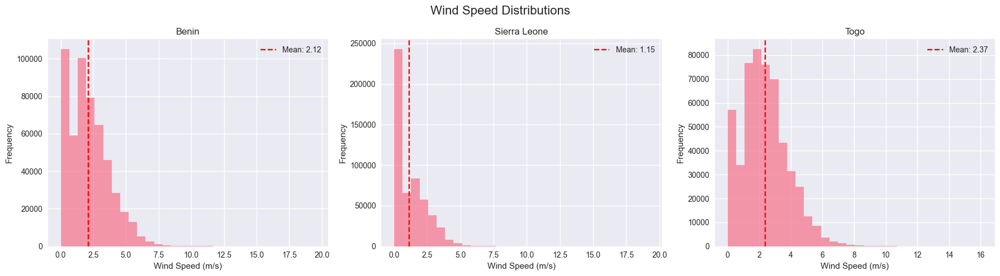

In [8]:
# Wind rose analysis
for country, df in dfs.items():
    if 'WS' in df.columns and 'WD' in df.columns:
        print(f"Wind Analysis for {country}:")
        print(f"  Mean wind speed: {df['WS'].mean():.2f} m/s")
        print(f"  Max wind speed: {df['WS'].max():.2f} m/s")
        print(f"  Wind speed std: {df['WS'].std():.2f} m/s")
        print(f"  Wind direction std: {df['WD'].std():.2f}°")
        
        # Wind rose plot
        try:
            wind_rose(df, speed_col='WS', dir_col='WD')
            plt.title(f'Wind Rose - {country}')
        except Exception as e:
            print(f"Could not create wind rose for {country}: {e}")
        
        plt.show()

# Wind speed distribution
fig, axes = plt.subplots(1, 3, figsize=(18, 5))
fig.suptitle('Wind Speed Distributions', fontsize=16)

for i, (country, df) in enumerate(dfs.items()):
    if 'WS' in df.columns:
        ax = axes[i]
        df['WS'].hist(bins=30, ax=ax, alpha=0.7)
        ax.set_title(f'{country}')
        ax.set_xlabel('Wind Speed (m/s)')
        ax.set_ylabel('Frequency')
        ax.axvline(df['WS'].mean(), color='red', linestyle='--', label=f'Mean: {df["WS"].mean():.2f}')
        ax.legend()

plt.tight_layout()
plt.show()

## 7. Temperature Analysis

Examine relationships between relative humidity, temperature readings, and solar radiation.


=== Temperature Analysis for Benin ===


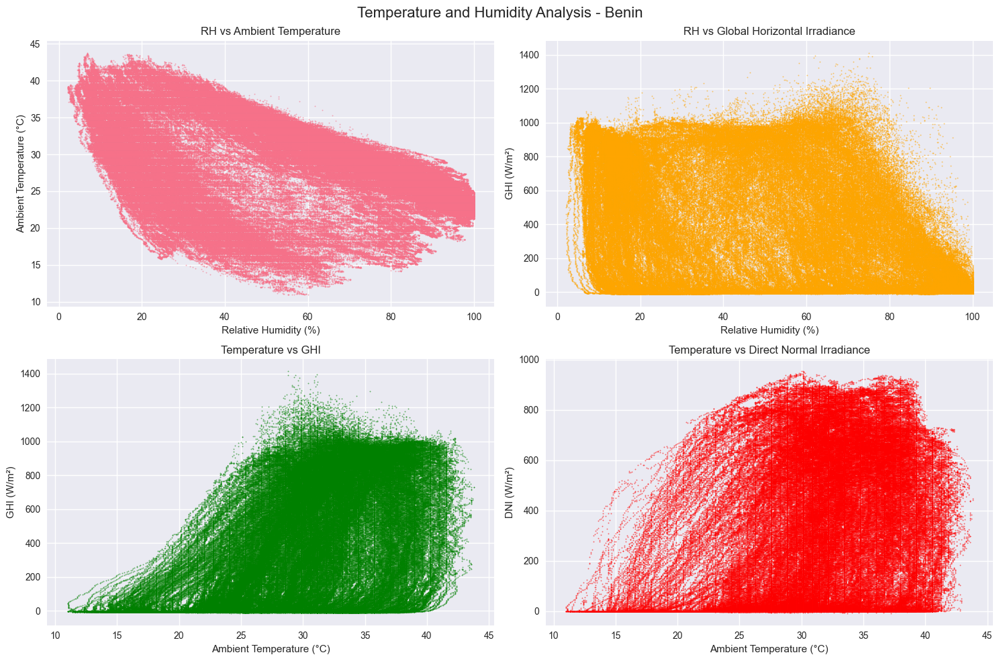

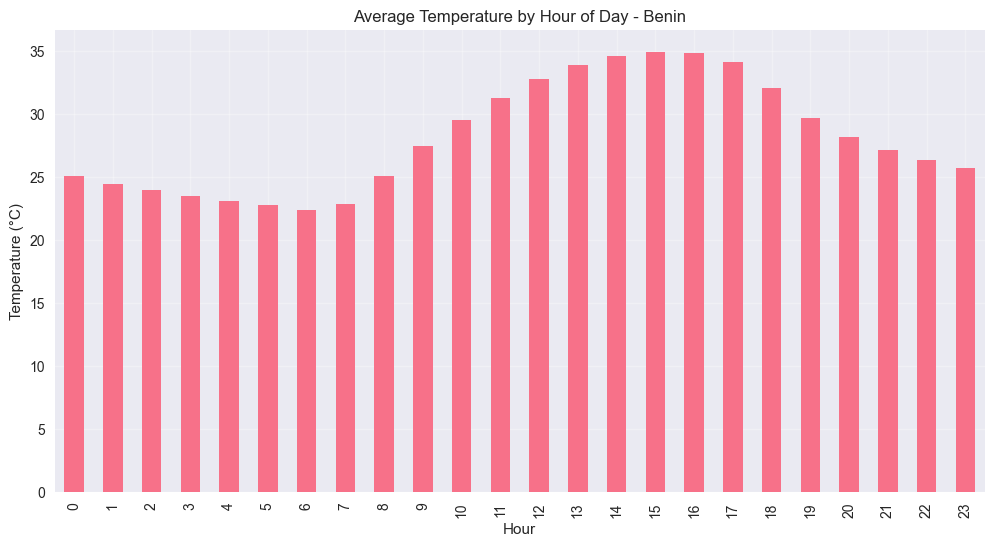


=== Temperature Analysis for Sierra Leone ===


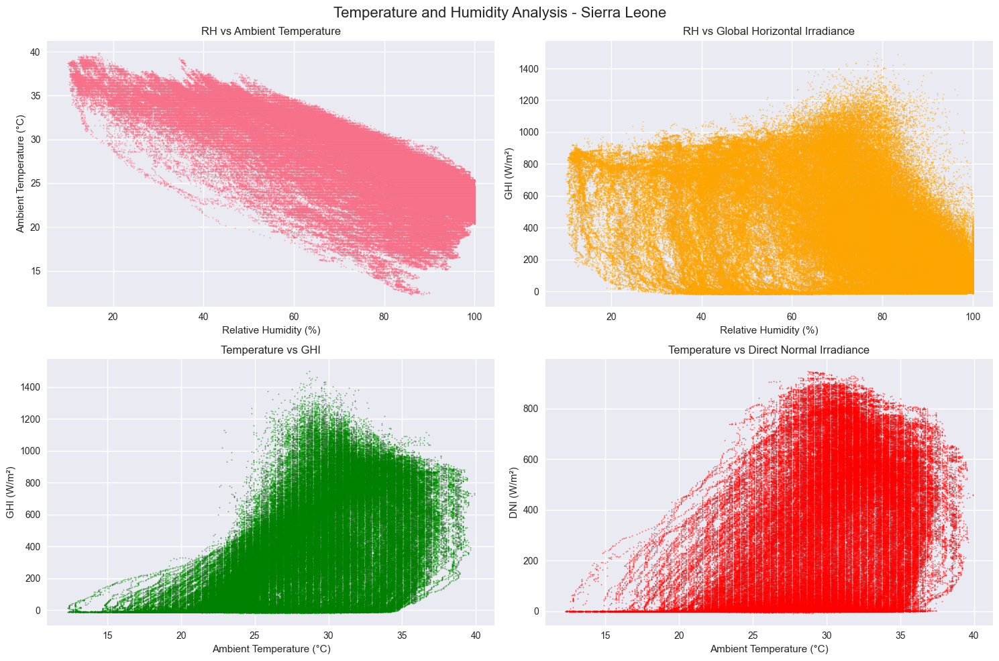

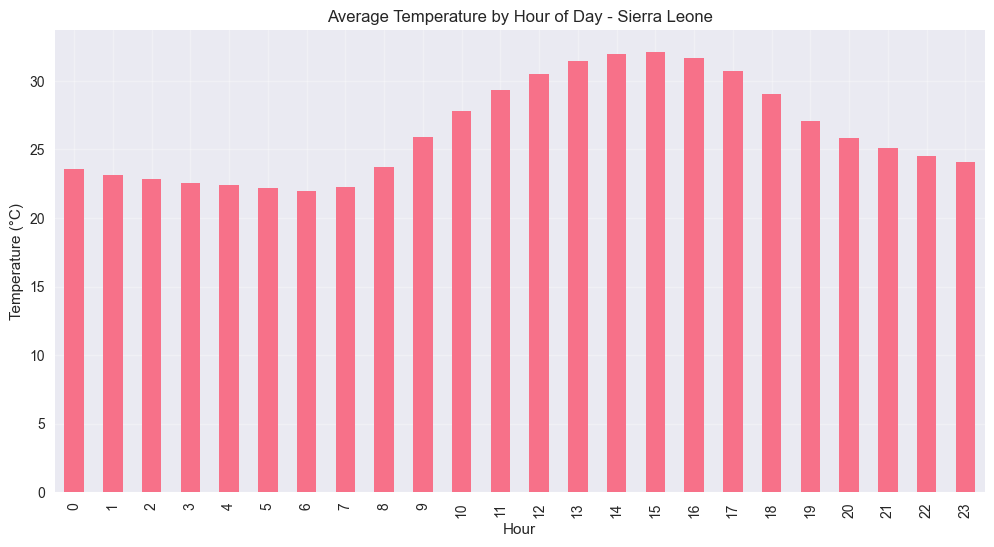


=== Temperature Analysis for Togo ===


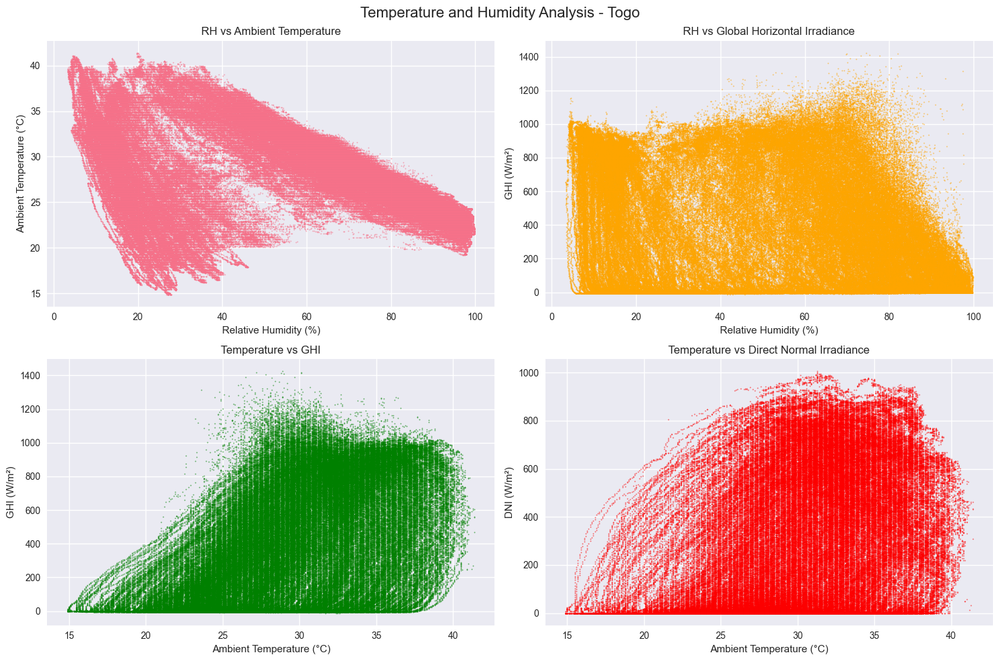

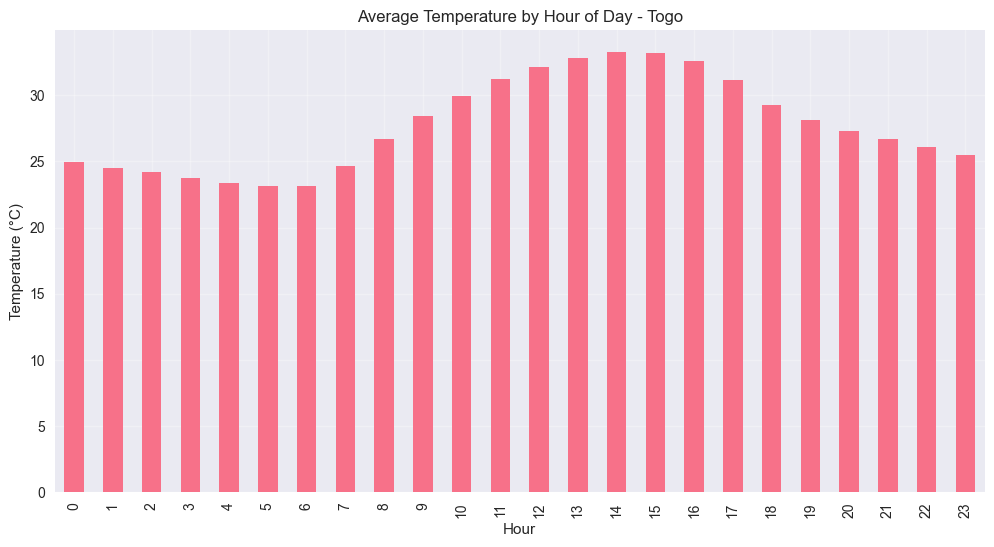

In [9]:
# Temperature analysis - All Countries
for country, df in dfs.items():
    print(f"\n=== Temperature Analysis for {country} ===")
    
    fig, axes = plt.subplots(2, 2, figsize=(15, 10))
    fig.suptitle(f'Temperature and Humidity Analysis - {country}', fontsize=16)
    
    # RH vs Temperature
    if 'RH' in df.columns and 'Tamb' in df.columns:
        axes[0,0].scatter(df['RH'], df['Tamb'], alpha=0.5, s=1)
        axes[0,0].set_xlabel('Relative Humidity (%)')
        axes[0,0].set_ylabel('Ambient Temperature (°C)')
        axes[0,0].set_title('RH vs Ambient Temperature')
        axes[0,0].grid(True)
    
    # RH vs GHI
    if 'RH' in df.columns and 'GHI' in df.columns:
        axes[0,1].scatter(df['RH'], df['GHI'], alpha=0.5, s=1, color='orange')
        axes[0,1].set_xlabel('Relative Humidity (%)')
        axes[0,1].set_ylabel('GHI (W/m²)')
        axes[0,1].set_title('RH vs Global Horizontal Irradiance')
        axes[0,1].grid(True)
    
    # Temperature vs GHI
    if 'Tamb' in df.columns and 'GHI' in df.columns:
        axes[1,0].scatter(df['Tamb'], df['GHI'], alpha=0.5, s=1, color='green')
        axes[1,0].set_xlabel('Ambient Temperature (°C)')
        axes[1,0].set_ylabel('GHI (W/m²)')
        axes[1,0].set_title('Temperature vs GHI')
        axes[1,0].grid(True)
    
    # Temperature vs DNI
    if 'Tamb' in df.columns and 'DNI' in df.columns:
        axes[1,1].scatter(df['Tamb'], df['DNI'], alpha=0.5, s=1, color='red')
        axes[1,1].set_xlabel('Ambient Temperature (°C)')
        axes[1,1].set_ylabel('DNI (W/m²)')
        axes[1,1].set_title('Temperature vs Direct Normal Irradiance')
        axes[1,1].grid(True)
    
    plt.tight_layout()
    plt.show()
    
    # Daily temperature patterns
    if 'Timestamp' in df.columns and 'Tamb' in df.columns:
        df_copy = df.copy()
        df_copy['hour'] = df_copy['Timestamp'].dt.hour
        hourly_temp = df_copy.groupby('hour')['Tamb'].mean()
        
        plt.figure(figsize=(12, 6))
        hourly_temp.plot(kind='bar')
        plt.title(f'Average Temperature by Hour of Day - {country}')
        plt.xlabel('Hour')
        plt.ylabel('Temperature (°C)')
        plt.grid(True, alpha=0.3)
        plt.show()

In [10]:
# Extended Temperature Analysis for All Countries
print("=== Extended Temperature Analysis for All Countries ===")

for country, df in dfs.items():
    print(f"\n--- {country} Temperature Patterns ---")
    
    # Calculate temperature statistics
    if 'Tamb' in df.columns:
        temp_stats = df['Tamb'].describe()
        print(f"Average Temperature: {temp_stats['mean']:.2f}°C")
        print(f"Temperature Range: {temp_stats['min']:.2f}°C to {temp_stats['max']:.2f}°C")
        print(f"Temperature Variability (std): {temp_stats['std']:.2f}°C")
    
    # RH and temperature correlation
    if 'RH' in df.columns and 'Tamb' in df.columns:
        corr_rh_temp = df['RH'].corr(df['Tamb'])
        print(f"RH-Temperature Correlation: {corr_rh_temp:.3f}")
    
    # Temperature and solar radiation relationship
    if 'Tamb' in df.columns and 'GHI' in df.columns:
        corr_temp_ghi = df['Tamb'].corr(df['GHI'])
        print(f"Temperature-GHI Correlation: {corr_temp_ghi:.3f}")

# Comparative temperature analysis
temp_comparison = {}
for country, df in dfs.items():
    if 'Tamb' in df.columns:
        temp_comparison[country] = {
            'mean': df['Tamb'].mean(),
            'max': df['Tamb'].max(),
            'min': df['Tamb'].min(),
            'std': df['Tamb'].std()
        }

print("\n=== Temperature Comparison Across Countries ===")
temp_df = pd.DataFrame(temp_comparison).T
print(temp_df.round(2))

=== Extended Temperature Analysis for All Countries ===

--- Benin Temperature Patterns ---
Average Temperature: 28.18°C
Temperature Range: 11.00°C to 43.80°C
Temperature Variability (std): 5.92°C
RH-Temperature Correlation: -0.415
Temperature-GHI Correlation: 0.548

--- Sierra Leone Temperature Patterns ---
Average Temperature: 26.32°C
Temperature Range: 12.30°C to 39.90°C
Temperature Variability (std): 4.40°C
RH-Temperature Correlation: -0.792
Temperature-GHI Correlation: 0.641

--- Togo Temperature Patterns ---
Average Temperature: 27.75°C
Temperature Range: 14.90°C to 41.40°C
Temperature Variability (std): 4.76°C
RH-Temperature Correlation: -0.400
Temperature-GHI Correlation: 0.563

=== Temperature Comparison Across Countries ===
               mean   max   min   std
Benin         28.18  43.8  11.0  5.92
Sierra Leone  26.32  39.9  12.3  4.40
Togo          27.75  41.4  14.9  4.76


## 8. Histograms

Create histograms for key variables to visualize frequency distributions.

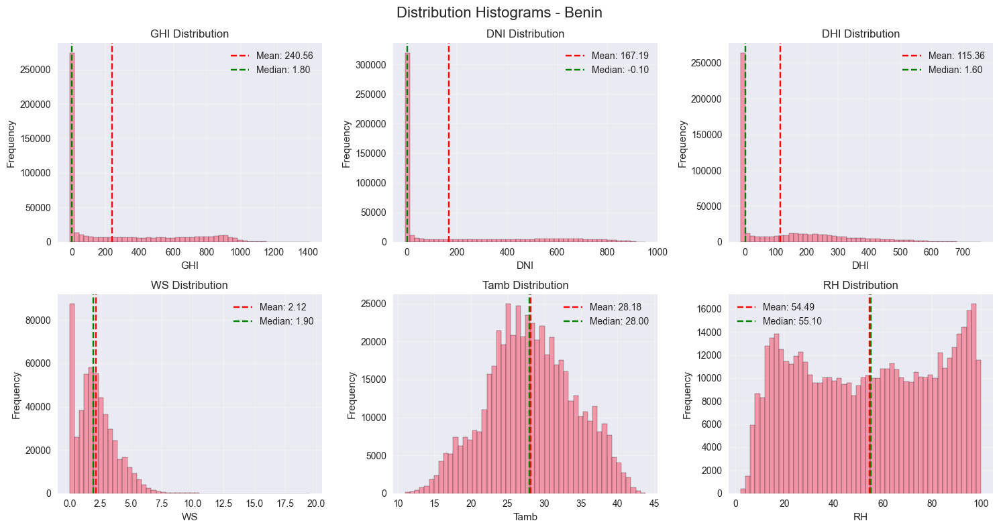

In [11]:
# Histograms for key variables
histogram_vars = ['GHI', 'DNI', 'DHI', 'WS', 'Tamb', 'RH']
available_hist_vars = [var for var in histogram_vars if var in dfs['Benin'].columns]

n_vars = len(available_hist_vars)
n_cols = 3
n_rows = (n_vars + n_cols - 1) // n_cols

fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 4*n_rows))
fig.suptitle('Distribution Histograms - Benin', fontsize=16)

if n_rows == 1:
    axes = axes.reshape(1, -1)

for i, var in enumerate(available_hist_vars):
    row, col = i // n_cols, i % n_cols
    ax = axes[row, col]
    
    data = dfs['Benin'][var].dropna()
    ax.hist(data, bins=50, alpha=0.7, edgecolor='black')
    ax.set_title(f'{var} Distribution')
    ax.set_xlabel(var)
    ax.set_ylabel('Frequency')
    ax.grid(True, alpha=0.3)
    
    # Add statistics
    mean_val = data.mean()
    median_val = data.median()
    ax.axvline(mean_val, color='red', linestyle='--', label=f'Mean: {mean_val:.2f}')
    ax.axvline(median_val, color='green', linestyle='--', label=f'Median: {median_val:.2f}')
    ax.legend()

# Hide empty subplots
for i in range(len(available_hist_vars), n_rows * n_cols):
    row, col = i // n_cols, i % n_cols
    axes[row, col].set_visible(False)

plt.tight_layout()
plt.show()

=== Distribution Histograms for All Countries ===

--- Benin Distributions ---


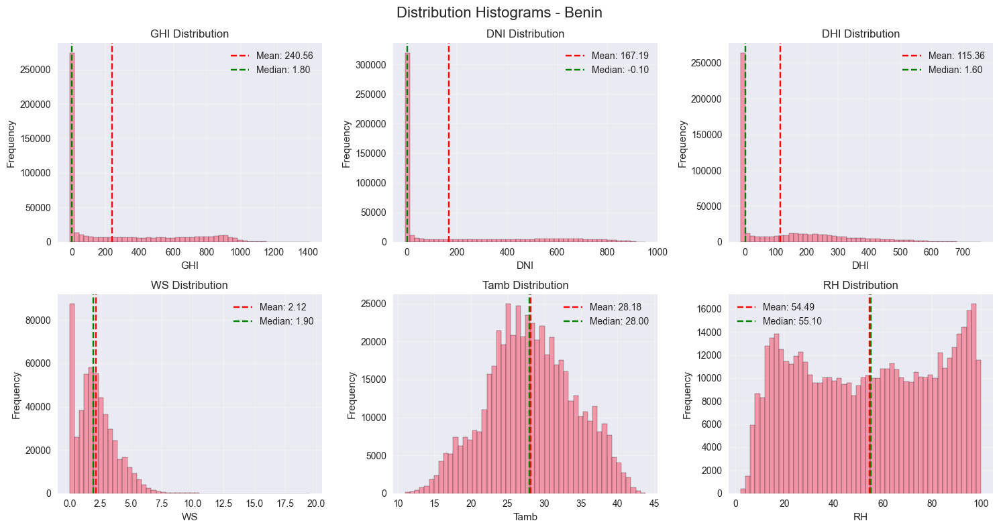


--- Sierra Leone Distributions ---


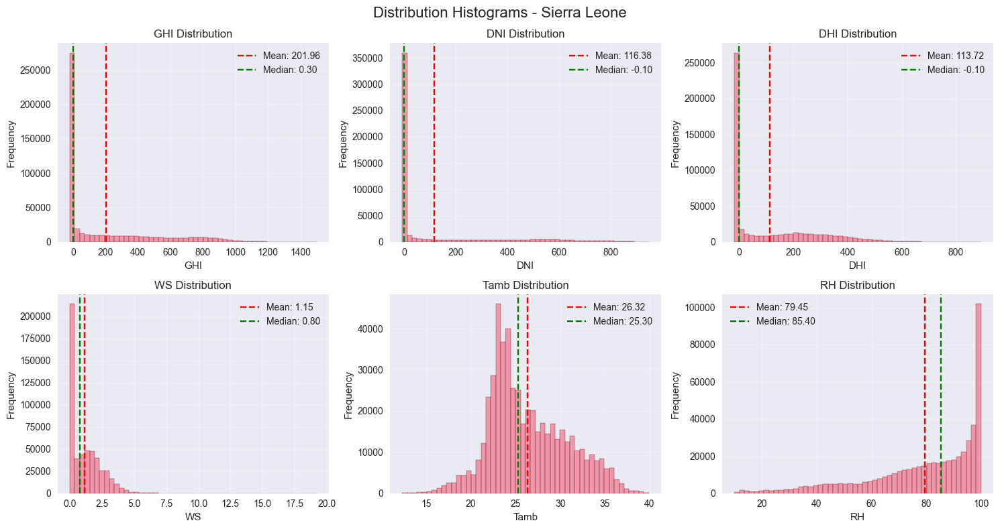


--- Togo Distributions ---


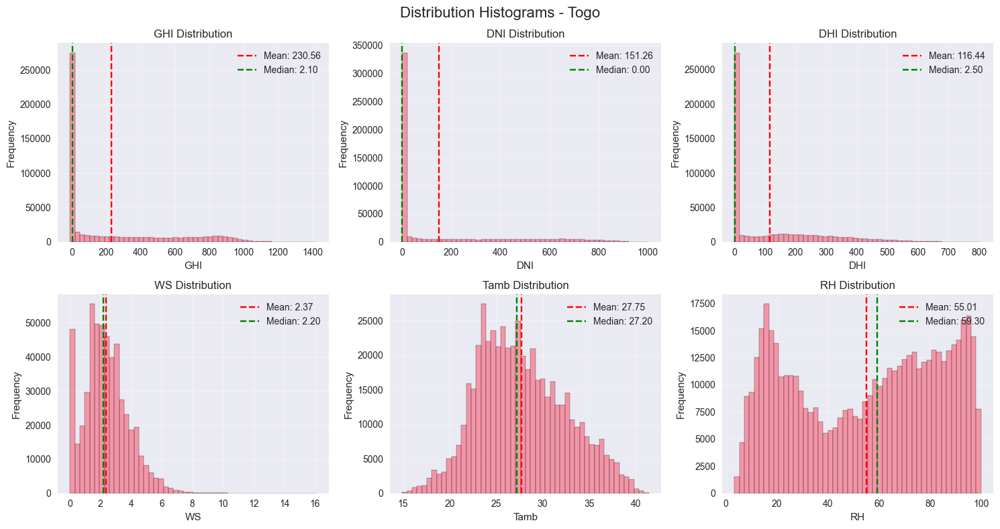

In [12]:
# Extended Histograms for All Countries
print("=== Distribution Histograms for All Countries ===")

histogram_vars = ['GHI', 'DNI', 'DHI', 'WS', 'Tamb', 'RH']

for country, df in dfs.items():
    print(f"\n--- {country} Distributions ---")
    
    available_hist_vars = [var for var in histogram_vars if var in df.columns]
    n_vars = len(available_hist_vars)
    
    if n_vars > 0:
        n_cols = min(3, n_vars)
        n_rows = (n_vars + n_cols - 1) // n_cols
        
        fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 4*n_rows))
        fig.suptitle(f'Distribution Histograms - {country}', fontsize=16)
        
        if n_rows == 1 and n_cols == 1:
            axes = [axes]
        elif n_rows == 1:
            axes = axes.flatten()
        else:
            axes = axes.flatten()
        
        for i, var in enumerate(available_hist_vars):
            if i < len(axes):
                ax = axes[i]
                data = df[var].dropna()
                ax.hist(data, bins=50, alpha=0.7, edgecolor='black')
                ax.set_title(f'{var} Distribution')
                ax.set_xlabel(var)
                ax.set_ylabel('Frequency')
                ax.grid(True, alpha=0.3)
                
                # Add statistics
                mean_val = data.mean()
                median_val = data.median()
                ax.axvline(mean_val, color='red', linestyle='--', label=f'Mean: {mean_val:.2f}')
                ax.axvline(median_val, color='green', linestyle='--', label=f'Median: {median_val:.2f}')
                ax.legend()
        
        # Hide empty subplots
        for i in range(len(available_hist_vars), len(axes)):
            axes[i].set_visible(False)
        
        plt.tight_layout()
        plt.show()

## 9. Z-Score Analysis

Calculate Z-scores to flag data points that are significantly different from the mean.

Z-Score Outlier Analysis:

Benin:
  GHI: 89 outliers (0.02%)
  DNI: 0 outliers (0.00%)
  DHI: 3738 outliers (0.71%)
  ModA: 27 outliers (0.01%)
  ModB: 63 outliers (0.01%)
  WS: 3109 outliers (0.59%)
  WSgust: 3500 outliers (0.67%)
  Tamb: 0 outliers (0.00%)

Sierra Leone:
  GHI: 2477 outliers (0.47%)
  DNI: 7586 outliers (1.44%)
  DHI: 2986 outliers (0.57%)
  ModA: 1604 outliers (0.31%)
  ModB: 2041 outliers (0.39%)
  WS: 3967 outliers (0.75%)
  WSgust: 3665 outliers (0.70%)
  Tamb: 192 outliers (0.04%)

Togo:
  GHI: 305 outliers (0.06%)
  DNI: 1062 outliers (0.20%)
  DHI: 3415 outliers (0.65%)
  ModA: 137 outliers (0.03%)
  ModB: 206 outliers (0.04%)
  WS: 3510 outliers (0.67%)
  WSgust: 3915 outliers (0.74%)
  Tamb: 0 outliers (0.00%)


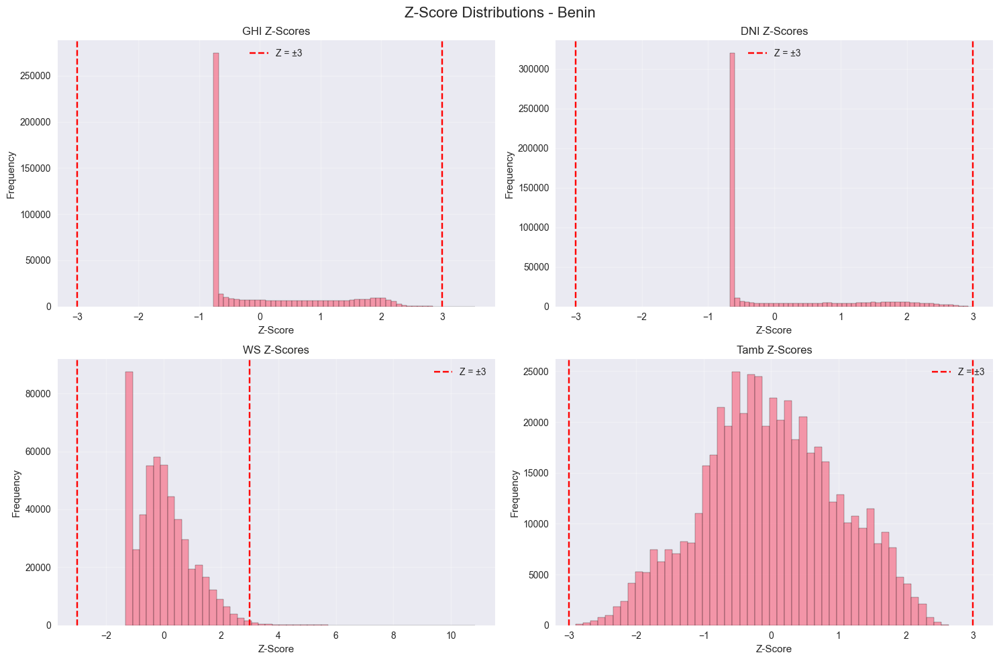

In [13]:
# Z-score analysis for outlier detection
zscore_analysis = {}

for country, df in dfs.items():
    country_zscores = {}
    key_cols = ['GHI', 'DNI', 'DHI', 'ModA', 'ModB', 'WS', 'WSgust', 'Tamb']
    available_cols = [col for col in key_cols if col in df.columns]
    
    for col in available_cols:
        df_z = flag_outliers_z(df.copy(), col, threshold=3.0)
        outlier_count = df_z[f'{col}_outlier'].sum()
        outlier_pct = 100 * outlier_count / len(df_z)
        country_zscores[col] = {
            'outlier_count': outlier_count,
            'outlier_percentage': outlier_pct,
            'zscore_stats': df_z[f'{col}_z'].describe()
        }
    
    zscore_analysis[country] = country_zscores

print("Z-Score Outlier Analysis:")
for country, analysis in zscore_analysis.items():
    print(f"\n{country}:")
    for col, stats in analysis.items():
        print(f"  {col}: {stats['outlier_count']} outliers ({stats['outlier_percentage']:.2f}%)")

# Visualize Z-scores for key metrics
fig, axes = plt.subplots(2, 2, figsize=(15, 10))
fig.suptitle('Z-Score Distributions - Benin', fontsize=16)

benin_z = dfs['Benin'].copy()
key_metrics = ['GHI', 'DNI', 'WS', 'Tamb']
available_metrics = [m for m in key_metrics if m in benin_z.columns]

for i, metric in enumerate(available_metrics[:4]):  # Limit to 4 plots
    ax = axes[i//2, i%2]
    z_scores = compute_zscore(benin_z[metric])
    ax.hist(z_scores, bins=50, alpha=0.7, edgecolor='black')
    ax.set_title(f'{metric} Z-Scores')
    ax.set_xlabel('Z-Score')
    ax.set_ylabel('Frequency')
    ax.axvline(3, color='red', linestyle='--', label='Z = ±3')
    ax.axvline(-3, color='red', linestyle='--')
    ax.legend()
    ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

=== Z-Score Outlier Analysis for All Countries ===

--- Benin Outlier Analysis ---
  GHI: 89 outliers (0.02%)
  DNI: 0 outliers (0.00%)
  DHI: 3738 outliers (0.71%)
  ModA: 27 outliers (0.01%)
  ModB: 63 outliers (0.01%)
  WS: 3109 outliers (0.59%)
  WSgust: 3500 outliers (0.67%)
  Tamb: 0 outliers (0.00%)

--- Sierra Leone Outlier Analysis ---
  GHI: 2477 outliers (0.47%)
  DNI: 7586 outliers (1.44%)
  DHI: 2986 outliers (0.57%)
  ModA: 1604 outliers (0.31%)
  ModB: 2041 outliers (0.39%)
  WS: 3967 outliers (0.75%)
  WSgust: 3665 outliers (0.70%)
  Tamb: 192 outliers (0.04%)

--- Togo Outlier Analysis ---
  GHI: 305 outliers (0.06%)
  DNI: 1062 outliers (0.20%)
  DHI: 3415 outliers (0.65%)
  ModA: 137 outliers (0.03%)
  ModB: 206 outliers (0.04%)
  WS: 3510 outliers (0.67%)
  WSgust: 3915 outliers (0.74%)
  Tamb: 0 outliers (0.00%)

=== Outlier Comparison Across Countries ===
               GHI   DNI   DHI  ModA  ModB    WS  WSgust  Tamb
Benin         0.02  0.00  0.71  0.01  0.01  0.5

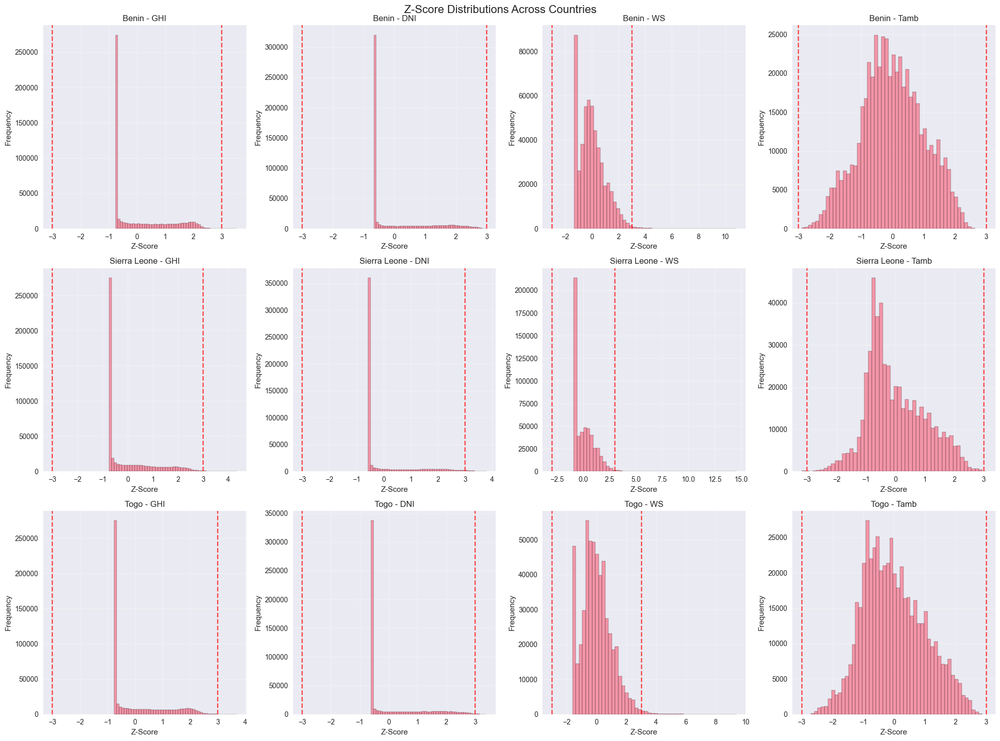

In [14]:
# Extended Z-Score Analysis for All Countries
print("=== Z-Score Outlier Analysis for All Countries ===")

zscore_summary = {}

for country, df in dfs.items():
    print(f"\n--- {country} Outlier Analysis ---")
    
    country_zscores = {}
    key_cols = ['GHI', 'DNI', 'DHI', 'ModA', 'ModB', 'WS', 'WSgust', 'Tamb']
    available_cols = [col for col in key_cols if col in df.columns]
    
    for col in available_cols:
        df_z = flag_outliers_z(df.copy(), col, threshold=3.0)
        outlier_count = df_z[f'{col}_outlier'].sum()
        outlier_pct = 100 * outlier_count / len(df_z)
        country_zscores[col] = {
            'outlier_count': outlier_count,
            'outlier_percentage': outlier_pct
        }
        print(f"  {col}: {outlier_count} outliers ({outlier_pct:.2f}%)")
    
    zscore_summary[country] = country_zscores

# Comparative outlier analysis
print("\n=== Outlier Comparison Across Countries ===")
outlier_comparison = {}
for country, analysis in zscore_summary.items():
    outlier_comparison[country] = {col: stats['outlier_percentage'] for col, stats in analysis.items()}

outlier_df = pd.DataFrame(outlier_comparison).T
print(outlier_df.round(2))

# Visualize Z-scores for key metrics across countries
fig, axes = plt.subplots(3, 4, figsize=(20, 15))
fig.suptitle('Z-Score Distributions Across Countries', fontsize=16)

countries = list(dfs.keys())
key_metrics = ['GHI', 'DNI', 'WS', 'Tamb']

for i, country in enumerate(countries):
    df = dfs[country]
    available_metrics = [m for m in key_metrics if m in df.columns]
    
    for j, metric in enumerate(available_metrics[:4]):
        ax = axes[i, j]
        z_scores = compute_zscore(df[metric])
        ax.hist(z_scores, bins=50, alpha=0.7, edgecolor='black')
        ax.set_title(f'{country} - {metric}')
        ax.set_xlabel('Z-Score')
        ax.set_ylabel('Frequency')
        ax.axvline(3, color='red', linestyle='--', alpha=0.7)
        ax.axvline(-3, color='red', linestyle='--', alpha=0.7)
        ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

## 10. Bubble Charts

Generate bubble charts to explore complex relationships between variables.

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 25.0.1 -> 25.2
[notice] To update, run: python.exe -m pip install --upgrade pip


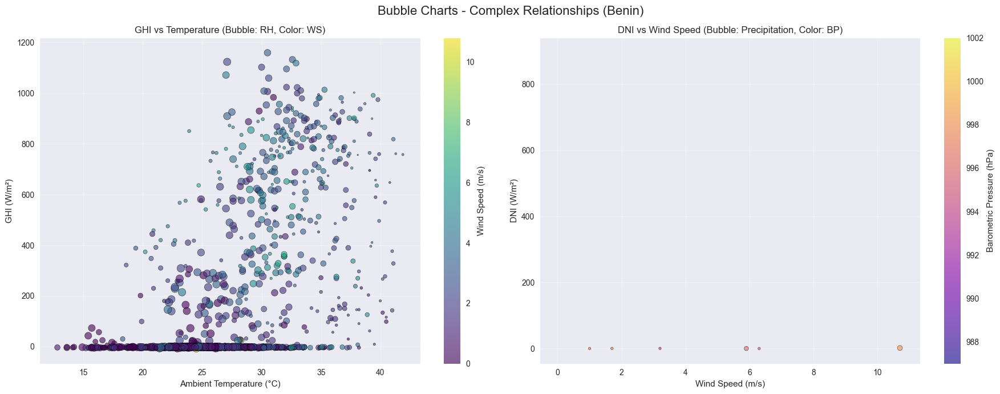

In [15]:
%pip install nbformat

# Bubble charts for complex relationships
benin_sample = dfs['Benin'].sample(1000)  # Sample for performance

fig, axes = plt.subplots(1, 2, figsize=(18, 7))
fig.suptitle('Bubble Charts - Complex Relationships (Benin)', fontsize=16)

# GHI vs Tamb vs WS (bubble size = RH)
if all(col in benin_sample.columns for col in ['GHI', 'Tamb', 'WS', 'RH']):
    scatter = axes[0].scatter(benin_sample['Tamb'], benin_sample['GHI'], 
                              s=benin_sample['RH'], c=benin_sample['WS'], 
                              alpha=0.6, cmap='viridis', edgecolors='black', linewidth=0.5)
    axes[0].set_xlabel('Ambient Temperature (°C)')
    axes[0].set_ylabel('GHI (W/m²)')
    axes[0].set_title('GHI vs Temperature (Bubble: RH, Color: WS)')
    axes[0].grid(True, alpha=0.3)
    plt.colorbar(scatter, ax=axes[0], label='Wind Speed (m/s)')

# DNI vs WS vs BP (bubble size = Precipitation)
if all(col in benin_sample.columns for col in ['DNI', 'WS', 'BP', 'Precipitation']):
    scatter2 = axes[1].scatter(benin_sample['WS'], benin_sample['DNI'], 
                               s=benin_sample['Precipitation']*100, c=benin_sample['BP'], 
                               alpha=0.6, cmap='plasma', edgecolors='black', linewidth=0.5)
    axes[1].set_xlabel('Wind Speed (m/s)')
    axes[1].set_ylabel('DNI (W/m²)')
    axes[1].set_title('DNI vs Wind Speed (Bubble: Precipitation, Color: BP)')
    axes[1].grid(True, alpha=0.3)
    plt.colorbar(scatter2, ax=axes[1], label='Barometric Pressure (hPa)')

plt.tight_layout()
plt.show()

# Interactive bubble chart with Plotly
if all(col in benin_sample.columns for col in ['GHI', 'Tamb', 'WS', 'RH']):
    fig = px.scatter(benin_sample, x='Tamb', y='GHI', size='RH', color='WS',
                     title='Interactive: GHI vs Temperature (Size: RH, Color: WS)',
                     labels={'Tamb': 'Temperature (°C)', 'GHI': 'GHI (W/m²)', 
                            'RH': 'Relative Humidity (%)', 'WS': 'Wind Speed (m/s)'})
    

=== Bubble Charts for All Countries ===

--- Benin Complex Relationships ---


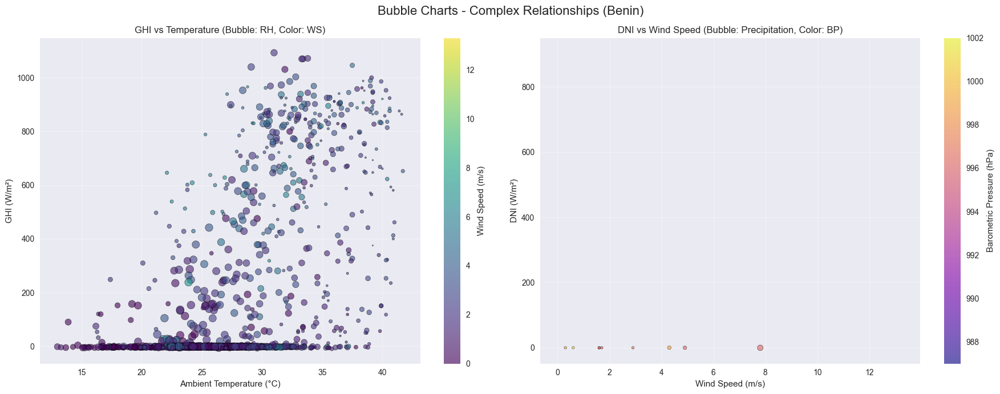


--- Sierra Leone Complex Relationships ---


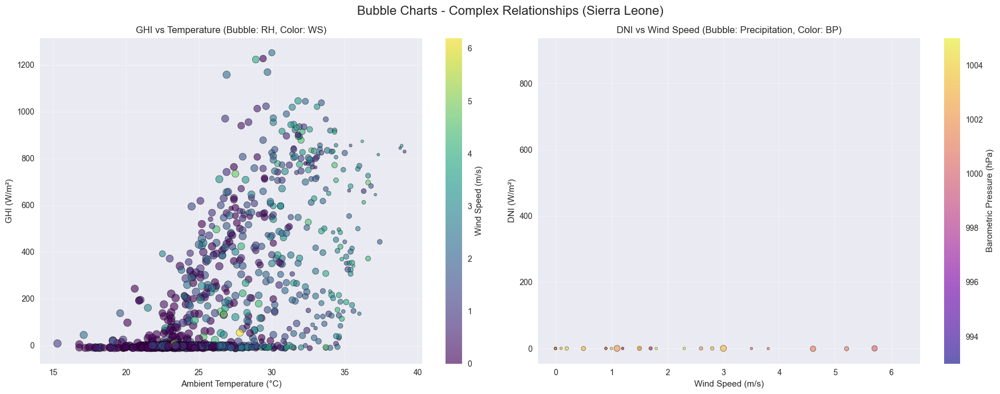


--- Togo Complex Relationships ---


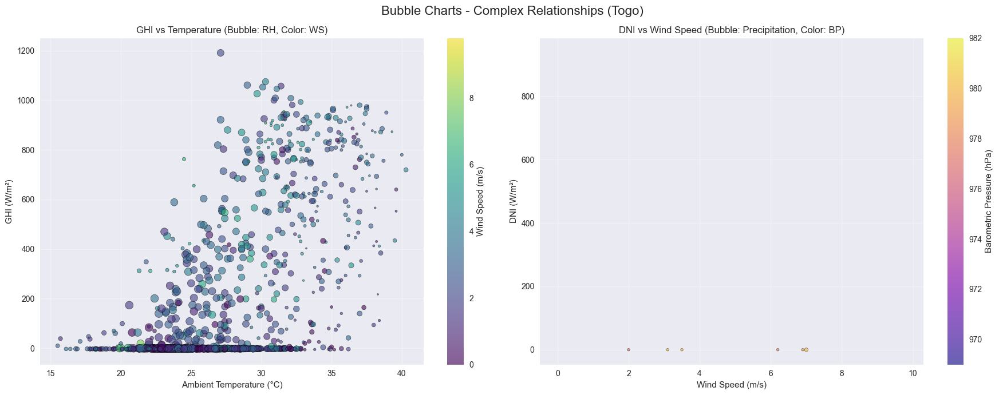

In [16]:
# Extended Bubble Charts for All Countries
print("=== Bubble Charts for All Countries ===")

for country, df in dfs.items():
    print(f"\n--- {country} Complex Relationships ---")
    
    sample = df.sample(min(1000, len(df)))  # Sample for performance
    
    fig, axes = plt.subplots(1, 2, figsize=(18, 7))
    fig.suptitle(f'Bubble Charts - Complex Relationships ({country})', fontsize=16)
    
    # GHI vs Tamb vs WS (bubble size = RH)
    if all(col in sample.columns for col in ['GHI', 'Tamb', 'WS', 'RH']):
        scatter = axes[0].scatter(sample['Tamb'], sample['GHI'], 
                                  s=sample['RH'], c=sample['WS'], 
                                  alpha=0.6, cmap='viridis', edgecolors='black', linewidth=0.5)
        axes[0].set_xlabel('Ambient Temperature (°C)')
        axes[0].set_ylabel('GHI (W/m²)')
        axes[0].set_title('GHI vs Temperature (Bubble: RH, Color: WS)')
        axes[0].grid(True, alpha=0.3)
        plt.colorbar(scatter, ax=axes[0], label='Wind Speed (m/s)')
    
    # DNI vs WS vs BP (bubble size = Precipitation)
    if all(col in sample.columns for col in ['DNI', 'WS', 'BP', 'Precipitation']):
        scatter2 = axes[1].scatter(sample['WS'], sample['DNI'], 
                                   s=sample['Precipitation']*100, c=sample['BP'], 
                                   alpha=0.6, cmap='plasma', edgecolors='black', linewidth=0.5)
        axes[1].set_xlabel('Wind Speed (m/s)')
        axes[1].set_ylabel('DNI (W/m²)')
        axes[1].set_title('DNI vs Wind Speed (Bubble: Precipitation, Color: BP)')
        axes[1].grid(True, alpha=0.3)
        plt.colorbar(scatter2, ax=axes[1], label='Barometric Pressure (hPa)')
    
    plt.tight_layout()
    plt.show()
    
    # Interactive bubble chart with Plotly
    if all(col in sample.columns for col in ['GHI', 'Tamb', 'WS', 'RH']):
        fig = px.scatter(sample, x='Tamb', y='GHI', size='RH', color='WS',
                         title=f'Interactive: GHI vs Temperature ({country}) - Size: RH, Color: WS',
                         labels={'Tamb': 'Temperature (°C)', 'GHI': 'GHI (W/m²)', 
                                'RH': 'Relative Humidity (%)', 'WS': 'Wind Speed (m/s)'})
        fig.show()

## 11. Data Cleaning

Clean the datasets by handling anomalies, missing values, and null columns based on the initial analysis.

In [17]:
# Data cleaning based on analysis
dfs_cleaned = {}

for country, df in dfs.items():
    print(f"Cleaning data for {country}...")
    
    # Start with copy
    df_clean = df.copy()
    
    # Drop bad timestamps
    df_clean = drop_bad_timestamps(df_clean)
    
    # Remove Comments column if it's mostly null
    if 'Comments' in df_clean.columns:
        null_pct = df_clean['Comments'].isnull().sum() / len(df_clean)
        if null_pct > 0.95:  # If >95% null, drop the column
            df_clean = df_clean.drop(columns=['Comments'])
            print(f"  Dropped 'Comments' column ({null_pct:.1%} null)")
    
    # Handle negative values in non-negative columns
    non_negative_cols = ['GHI', 'DNI', 'DHI', 'ModA', 'ModB', 'Precipitation', 'WS', 'WSgust']
    for col in non_negative_cols:
        if col in df_clean.columns:
            neg_count = (df_clean[col] < 0).sum()
            if neg_count > 0:
                # Replace negatives with NaN, then interpolate
                df_clean.loc[df_clean[col] < 0, col] = np.nan
                print(f"  Replaced {neg_count} negative values in {col} with NaN")
    
    # Interpolate missing values
    df_clean = fill_interpolate(df_clean)
    
    # Remove outliers based on Z-score (optional - can be aggressive)
    # For now, we'll keep them but flag them
    
    dfs_cleaned[country] = df_clean
    print(f"  Final shape: {df_clean.shape}")

print("\nData cleaning completed for all countries.")

# Compare before/after statistics
print("\nData quality comparison:")
for country in dfs.keys():
    print(f"\n{country}:")
    original_missing = dfs[country].isnull().sum().sum()
    cleaned_missing = dfs_cleaned[country].isnull().sum().sum()
    print(f"  Missing values: {original_missing} → {cleaned_missing}")
    
    if 'GHI' in dfs[country].columns:
        original_neg = (dfs[country]['GHI'] < 0).sum()
        cleaned_neg = (dfs_cleaned[country]['GHI'] < 0).sum()
        print(f"  Negative GHI: {original_neg} → {cleaned_neg}")

Cleaning data for Benin...
  Dropped 'Comments' column (100.0% null)
  Replaced 258847 negative values in GHI with NaN
  Replaced 275987 negative values in DNI with NaN
  Replaced 259182 negative values in DHI with NaN
  Final shape: (525600, 18)
Cleaning data for Sierra Leone...
  Dropped 'Comments' column (100.0% null)
  Replaced 261135 negative values in GHI with NaN
  Replaced 266352 negative values in DNI with NaN
  Replaced 263128 negative values in DHI with NaN
  Final shape: (525600, 18)
Cleaning data for Togo...
  Dropped 'Comments' column (100.0% null)
  Replaced 257385 negative values in GHI with NaN
  Final shape: (525600, 18)

Data cleaning completed for all countries.

Data quality comparison:

Benin:
  Missing values: 525600 → 0
  Negative GHI: 258847 → 0

Sierra Leone:
  Missing values: 525600 → 0
  Negative GHI: 261135 → 0

Togo:
  Missing values: 525600 → 0
  Negative GHI: 257385 → 0


## 12. Country Scoring and Strategic Recommendations

Score countries based on solar potential and provide strategic recommendations for MoonLight Energy Solutions.

In [18]:
# Country scoring for solar investment potential
country_scores = {}

for country, df in dfs_cleaned.items():
    # Create daily aggregates
    df_daily = add_daily_aggregates(df)
    
    # Score the country
    score_result = country_score(df_daily)
    country_scores[country] = score_result

print("Country Solar Potential Scores:")
print("-" * 50)
for country, result in country_scores.items():
    print(f"\n{country}:")
    print(f"  Score: {result['score']:.2f}")
    print("  Metrics:")
    for metric, value in result['agg'].items():
        print(f"    {metric}: {value:.2f}")

# Rank countries by score
ranked_countries = sorted(country_scores.items(), key=lambda x: x[1]['score'], reverse=True)

print("\n" + "="*60)
print("STRATEGIC RECOMMENDATIONS FOR MOONLIGHT ENERGY SOLUTIONS")
print("="*60)

print(f"\n🏆 TOP RECOMMENDATION: {ranked_countries[0][0]}")
print(f"   Score: {ranked_countries[0][1]['score']:.2f}")
print("   Key Advantages:")
score_data = ranked_countries[0][1]['agg']
if score_data['avg_GHI'] > 200:
    print("   ✓ Excellent solar irradiance potential")
if score_data['avg_DNI'] > score_data['avg_DHI']:
    print("   ✓ Favorable for concentrated solar power")
if score_data['avg_Tamb'] < 30:
    print("   ✓ Moderate temperatures (good for panel efficiency)")

print(f"\n📊 INVESTMENT PRIORITY RANKING:")
for i, (country, result) in enumerate(ranked_countries, 1):
    priority = "HIGH" if i == 1 else "MEDIUM" if i == 2 else "LOW"
    print(f"   {i}. {country}: Score {result['score']:.2f} ({priority})")

print("\n💡 KEY INSIGHTS:")
print("   • Focus initial investments in the highest-scoring location")
print("   • Consider hybrid systems combining solar with wind potential")
print("   • Implement regular cleaning schedules to maintain efficiency")
print("   • Monitor temperature correlations for optimal panel placement")
print("   • Account for seasonal variations in planning")

print("\n🎯 NEXT STEPS:")
print("   1. Conduct site visits to top-ranked locations")
print("   2. Perform detailed feasibility studies")
print("   3. Develop pilot projects in high-potential areas")
print("   4. Create monitoring systems for long-term performance")
print("   5. Scale successful implementations across regions")

Country Solar Potential Scores:
--------------------------------------------------

Benin:
  Score: 67.09
  Metrics:
    avg_GHI: 241.40
    avg_DNI: 167.03
    avg_DHI: 116.79
    avg_Tamb: 28.17

Sierra Leone:
  Score: 39.08
  Metrics:
    avg_GHI: 203.98
    avg_DNI: 116.25
    avg_DHI: 116.11
    avg_Tamb: 26.31

Togo:
  Score: 58.48
  Metrics:
    avg_GHI: 231.17
    avg_DNI: 150.85
    avg_DHI: 116.13
    avg_Tamb: 27.75

STRATEGIC RECOMMENDATIONS FOR MOONLIGHT ENERGY SOLUTIONS

🏆 TOP RECOMMENDATION: Benin
   Score: 67.09
   Key Advantages:
   ✓ Excellent solar irradiance potential
   ✓ Favorable for concentrated solar power
   ✓ Moderate temperatures (good for panel efficiency)

📊 INVESTMENT PRIORITY RANKING:
   1. Benin: Score 67.09 (HIGH)
   2. Togo: Score 58.48 (MEDIUM)
   3. Sierra Leone: Score 39.08 (LOW)

💡 KEY INSIGHTS:
   • Focus initial investments in the highest-scoring location
   • Consider hybrid systems combining solar with wind potential
   • Implement regular cle